<a href="https://colab.research.google.com/github/Sharik2610/mobile_price_range_prediction/blob/main/Mobile_price_range_prediction__sharik_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

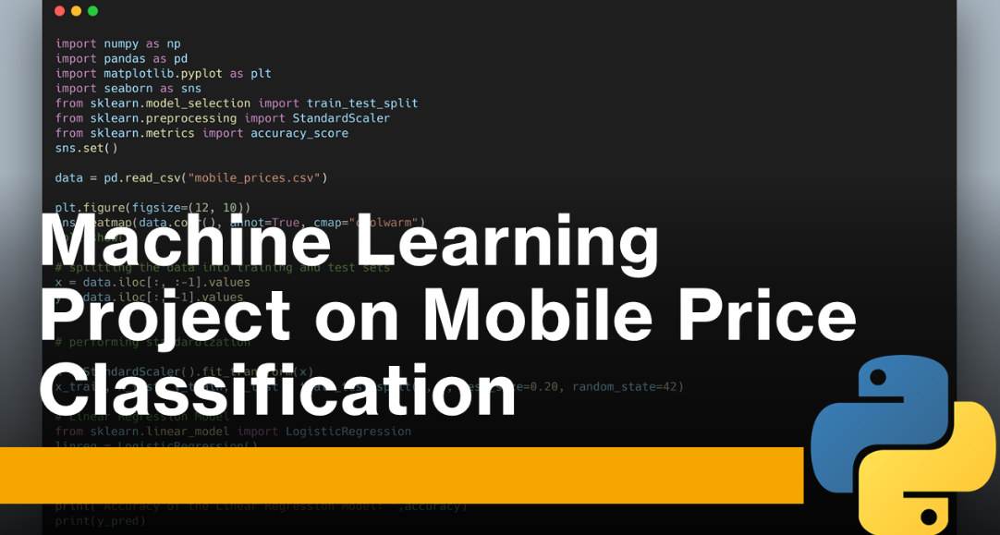

# <b><u> Project Title : Mobile Price Range Prediction </u></b>
#In the competitive mobile phone market companies want
#to understand sales data of mobile phones and factors which drive the prices.
#The objective is to find out some relation between features of a mobile phone(eg:- RAM,
#Internal Memory, etc) and its selling price. In this problem, we do not have to predict the
#actual price but a price range indicating how high the price is.



#**Data Description** -
Battery_power - Total energy a battery can store in one time measured in mAh

Blue - Has bluetooth or not

Clock_speed - speed at which microprocessor executes instructions

Dual_sim - Has dual sim support or not

Fc - Front Camera mega pixels

Four_g - Has 4G or not

Int_memory - Internal Memory in Gigabytes

M_dep - Mobile Depth in cm

Mobile_wt - Weight of mobile phone

N_cores - Number of cores of processor

Pc - Primary Camera mega pixels

Px_height - Pixel Resolution Height

Px_width - Pixel Resolution Width

Ram - Random Access Memory in Mega Bytes

Sc_h - Screen Height of mobile in cm

Sc_w - Screen Width of mobile in cm

Talk_time - longest time that a single battery charge will last when you are

Three_g - Has 3G or not

Touch_screen - Has touch screen or not

Wifi - Has wifi or not

Price_range - This is the target variable with value of 0(low cost), 1(medium cost),2(high cost) and 3(very high cost).

###**Importing Libararies**

In [ ]:
# importing the required libraries

import warnings    # do not disturb mode
warnings.filterwarnings('ignore')

import missingno as msno

import numpy as np   # numerical computations
import pandas as pd  # Data Manupulation

import matplotlib.pyplot as plt  # visualize with plots
%matplotlib inline
import seaborn as sns


import scipy.stats as stats   # statistics



from sklearn.model_selection import train_test_split   # split train and test data

from sklearn.compose import ColumnTransformer #  transformation

from sklearn.preprocessing import StandardScaler,MinMaxScaler # scale the data

from sklearn.preprocessing import FunctionTransformer,PowerTransformer

from sklearn.preprocessing import PolynomialFeatures  #Higher-Dimensional

from sklearn.linear_model import LogisticRegression # regression model

from sklearn.model_selection import GridSearchCV, cross_val_score # hyperparameters tunning




###**Dataset Loading**

In [ ]:
#mounting drive
from google.colab import drive
drive.mount('/content/drive',force_remount= True)

Mounted at /content/drive


In [ ]:
#defining file path
file_path= ('/content/drive/MyDrive/AlmaBetter/Capstone/classification model /data_mobile_price_range.csv')
df= pd.read_csv(file_path)

###**Dataset firstView**

In [ ]:
#first view of our data
df

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


In [ ]:
#for better understanding changed some columns name
df.rename(columns={'blue':'Bluetooth','fc':'Fcamera mega pixel','four_g':'4G','m_dep':'moblie_depth','pc':'main_camera','three_g':'3G','Fcamera mega pixel':'front_camera'},inplace=True)

In [ ]:
#It gives Top 5 rows of Dataset
df.head()

,battery_power,Bluetooth,clock_speed,dual_sim,Fcamera mega pixel,4G,int_memory,moblie_depth,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,3G,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [ ]:
# It's give total no of rows and column of our data set
print(f'we have total {df.shape[0]} rows and{df.shape[1]} columns.')

we have total 2000 rows and21 columns.


In [ ]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   battery_power       2000 non-null   int64  
 1   Bluetooth           2000 non-null   int64  
 2   clock_speed         2000 non-null   float64
 3   dual_sim            2000 non-null   int64  
 4   Fcamera mega pixel  2000 non-null   int64  
 5   4G                  2000 non-null   int64  
 6   int_memory          2000 non-null   int64  
 7   moblie_depth        2000 non-null   float64
 8   mobile_wt           2000 non-null   int64  
 9   n_cores             2000 non-null   int64  
 10  main_camera         2000 non-null   int64  
 11  px_height           2000 non-null   int64  
 12  px_width            2000 non-null   int64  
 13  ram                 2000 non-null   int64  
 14  sc_h                2000 non-null   int64  
 15  sc_w                2000 non-null   int64  
 16  talk_t

###**Duplicate Value Count**

In [ ]:
# Dataset Duplicate Value Count
No_of_duplicate_rows=df[df.duplicated()].shape[0]
print(f'we hve total no {No_of_duplicate_rows} duplicate rows.')

we hve total no 0 duplicate rows.



Having no duplicate values makes the dataset easier for us to work with.

### **Null Values in the Dataset**

In [ ]:
#checking null values
df.isnull().sum()

battery_power         0
Bluetooth             0
clock_speed           0
dual_sim              0
Fcamera mega pixel    0
4G                    0
int_memory            0
moblie_depth          0
mobile_wt             0
n_cores               0
main_camera           0
px_height             0
px_width              0
ram                   0
sc_h                  0
sc_w                  0
talk_time             0
3G                    0
touch_screen          0
wifi                  0
price_range           0
dtype: int64

It's good to see that our dataset have zero nullvalues

<Axes: >

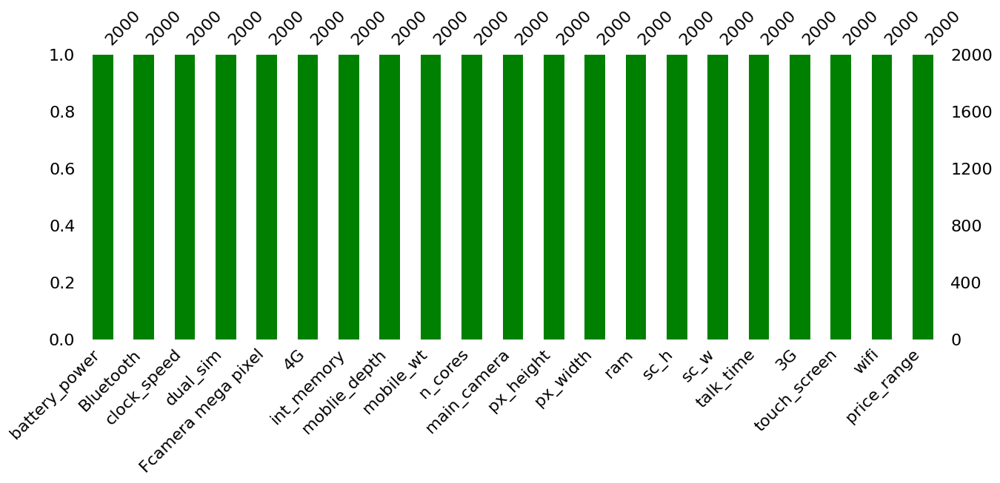

In [ ]:
# Visualizing the missing values
msno.bar(df,figsize=(15,5), color="green")

###What did you know about your dataset?

We get to know the following points about our dataset:
1. The dataset contains 2000 rows and 21 columns.
2. The dataset don't have any duplicated observations.
3. 'clock_speed' and ' moblie_depth' feature is of float dype and rest others are integers.

###**Understanding Variable**

In [ ]:
# Dataset Describe
df.describe(include="all").T

,count,mean,std,min,25%,50%,75%,max
battery_power,2000.0,1238.51850,439.418206,501.0,851.75,1226.0,1615.25,1998.0
Bluetooth,2000.0,0.49500,0.500100,0.0,0.00,0.0,1.00,1.0
clock_speed,2000.0,1.52225,0.816004,0.5,0.70,1.5,2.20,3.0
dual_sim,2000.0,0.50950,0.500035,0.0,0.00,1.0,1.00,1.0
Fcamera mega pixel,2000.0,4.30950,4.341444,0.0,1.00,3.0,7.00,19.0
4G,2000.0,0.52150,0.499662,0.0,0.00,1.0,1.00,1.0
int_memory,2000.0,32.04650,18.145715,2.0,16.00,32.0,48.00,64.0
moblie_depth,2000.0,0.50175,0.288416,0.1,0.20,0.5,0.80,1.0
mobile_wt,2000.0,140.24900,35.399655,80.0,109.00,141.0,170.00,200.0
n_cores,2000.0,4.52050,2.287837,1.0,3.00,4.0,7.00,8.0


In [ ]:
# Dataset Columns
df.columns

Index(['battery_power', 'Bluetooth', 'clock_speed', 'dual_sim',
       'Fcamera mega pixel', '4G', 'int_memory', 'moblie_depth', 'mobile_wt',
       'n_cores', 'main_camera', 'px_height', 'px_width', 'ram', 'sc_h',
       'sc_w', 'talk_time', '3G', 'touch_screen', 'wifi', 'price_range'],
      dtype='object')

###**Data Wrangling**

In [ ]:
#check no of unique values in each columns
for column in df.columns:
    unique_values = df[column].nunique()
    print(f"Unique values in '{column}':")
    print(unique_values)
    #print()


Unique values in 'battery_power':
1094
Unique values in 'Bluetooth':
2
Unique values in 'clock_speed':
26
Unique values in 'dual_sim':
2
Unique values in 'Fcamera mega pixel':
20
Unique values in '4G':
2
Unique values in 'int_memory':
63
Unique values in 'moblie_depth':
10
Unique values in 'mobile_wt':
121
Unique values in 'n_cores':
8
Unique values in 'main_camera':
21
Unique values in 'px_height':
1137
Unique values in 'px_width':
1109
Unique values in 'ram':
1562
Unique values in 'sc_h':
15
Unique values in 'sc_w':
19
Unique values in 'talk_time':
19
Unique values in '3G':
2
Unique values in 'touch_screen':
2
Unique values in 'wifi':
2
Unique values in 'price_range':
4


In [ ]:
#check categorical and continous columns
cat_col=[]
con_col=[]

for i in df.columns:
  if df[i].nunique() <= 10:
    cat_col.append(i)
  elif df[i].nunique() >= 9:
    con_col.append(i)

In [ ]:
# Checking the definded lists
print(cat_col)
print(con_col)

['Bluetooth', 'dual_sim', '4G', 'moblie_depth', 'n_cores', '3G', 'touch_screen', 'wifi', 'price_range']
['battery_power', 'clock_speed', 'Fcamera mega pixel', 'int_memory', 'mobile_wt', 'main_camera', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']


In [ ]:
cat_col_df=df[cat_col]
con_col_df=df[con_col]

In [ ]:
con_col_df

,battery_power,clock_speed,Fcamera mega pixel,int_memory,mobile_wt,main_camera,px_height,px_width,ram,sc_h,sc_w,talk_time
0,842,2.2,1,7,188,2,20,756,2549,9,7,19
1,1021,0.5,0,53,136,6,905,1988,2631,17,3,7
2,563,0.5,2,41,145,6,1263,1716,2603,11,2,9
3,615,2.5,0,10,131,9,1216,1786,2769,16,8,11
4,1821,1.2,13,44,141,14,1208,1212,1411,8,2,15
...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,0.5,0,2,106,14,1222,1890,668,13,4,19
1996,1965,2.6,0,39,187,3,915,1965,2032,11,10,16
1997,1911,0.9,1,36,108,3,868,1632,3057,9,1,5
1998,1512,0.9,4,46,145,5,336,670,869,18,10,19


###**Data Visualisation**

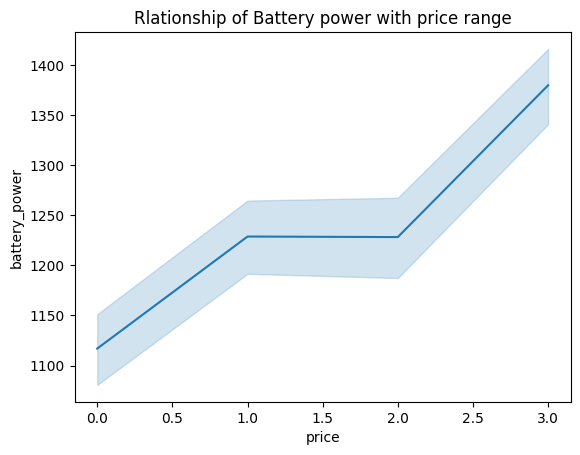

In [ ]:
#
sns.lineplot(y='battery_power', x='price_range', data=df)

#
plt.ylabel('battery_power')
plt.xlabel('price')
plt.title('Rlationship of Battery power with price range')

#
plt.show()

**The line plot provided above indicates that as the phone model's battery capacity increases, its price range is also increasing in a similar manner.**

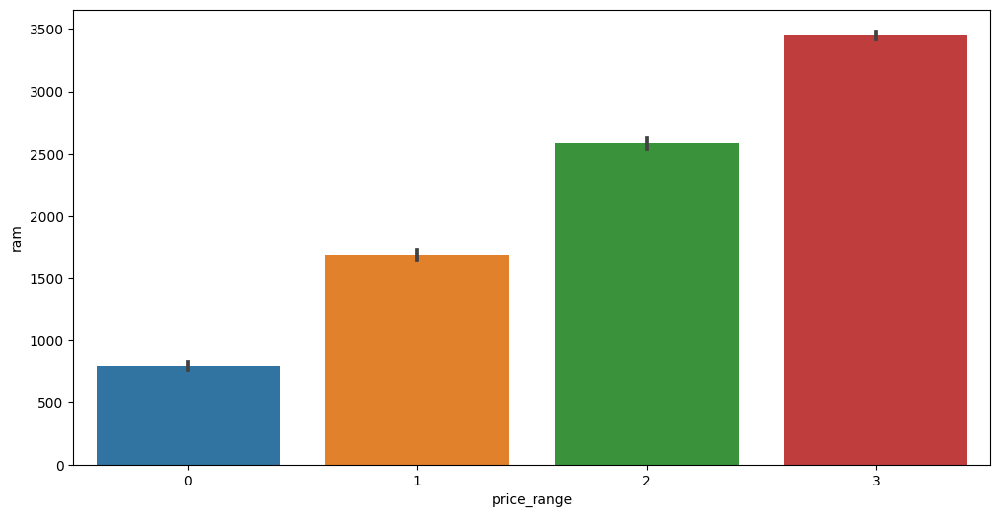

In [ ]:
plt.figure(figsize = (12,6))
sns.barplot(x = 'price_range', y = 'ram',data=df)
plt.show()

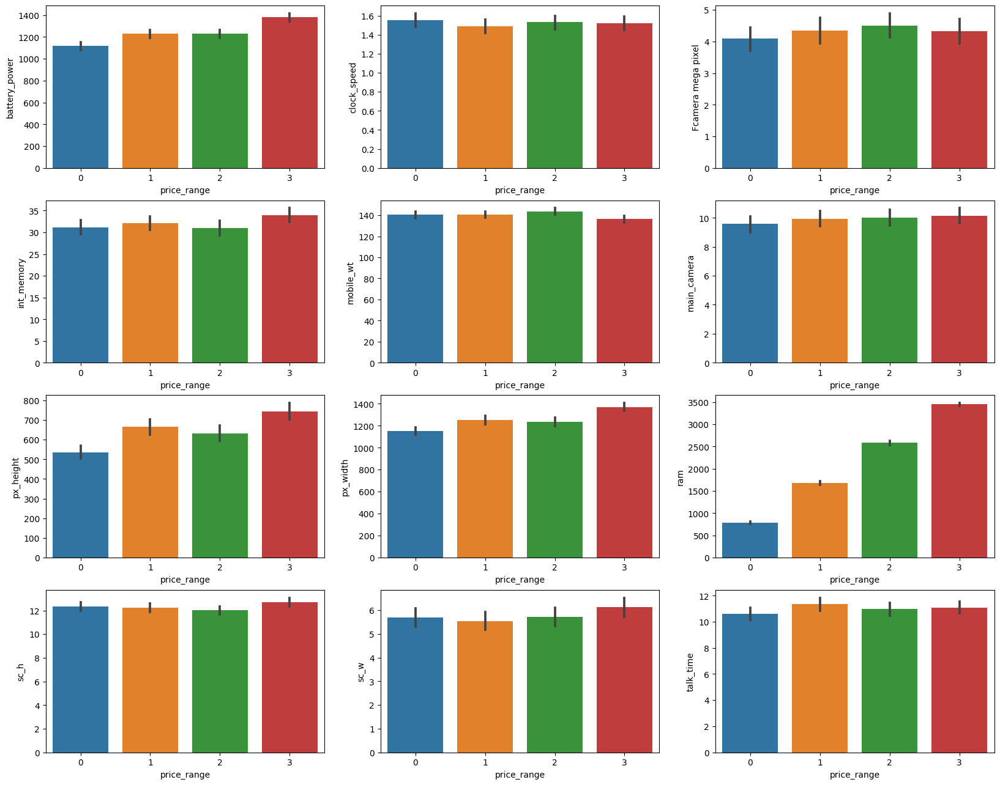

In [ ]:
plt.figure(figsize=(20,20))
j=1
for i in con_col_df.columns:
  plt.subplot(5,3,j)
  j=j+1
  sns.barplot(x=df['price_range'],y=con_col_df[i])



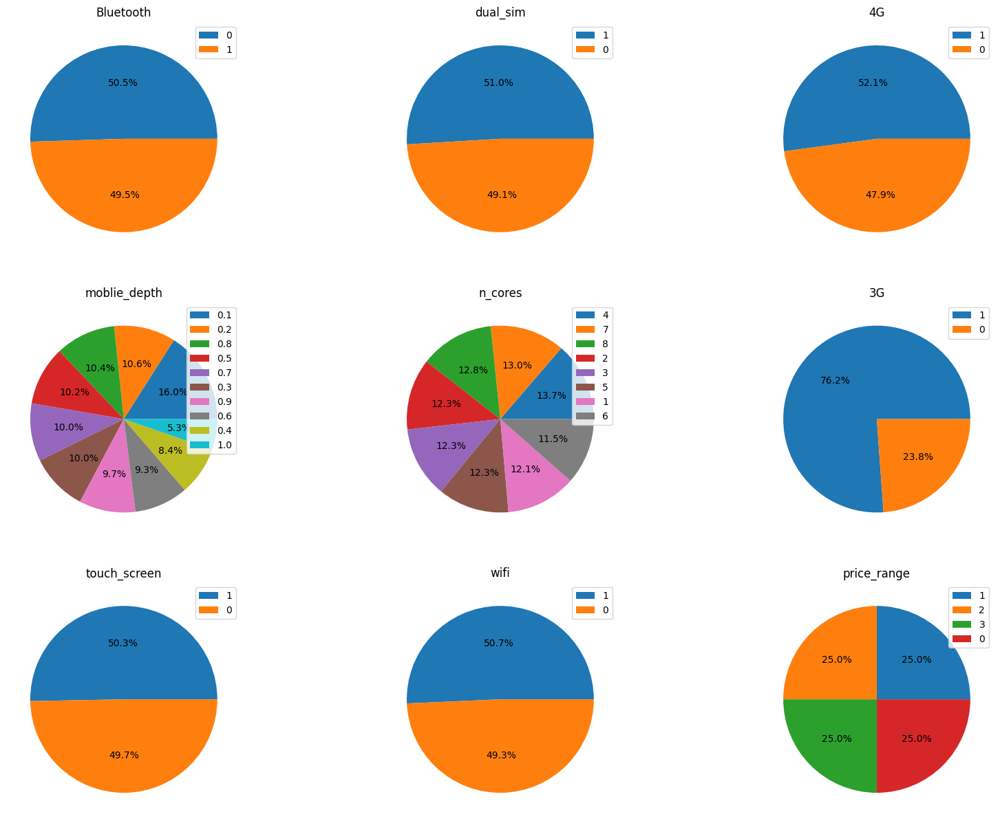

In [ ]:



plt.figure(figsize=(20,15))

j=1


for i in cat_col_df.columns:
  plt.subplot(3, 3,j)
  j=j+1
  cat_col_df[i].value_counts().plot.pie (autopct='%1.1f%%',shadow=False,labeldistance=None)
  plt.legend(loc='upper right', bbox_to_anchor=(1, 1))
  plt.ylabel('')
  plt.title(i)



In [ ]:
# check how is the correlation between cols
df.corr()['price_range'].sort_values(ascending=False)

price_range           1.000000
ram                   0.917046
battery_power         0.200723
px_width              0.165818
px_height             0.148858
int_memory            0.044435
sc_w                  0.038711
main_camera           0.033599
3G                    0.023611
sc_h                  0.022986
Fcamera mega pixel    0.021998
talk_time             0.021859
Bluetooth             0.020573
wifi                  0.018785
dual_sim              0.017444
4G                    0.014772
n_cores               0.004399
moblie_depth          0.000853
clock_speed          -0.006606
mobile_wt            -0.030302
touch_screen         -0.030411
Name: price_range, dtype: float64

<Axes: >

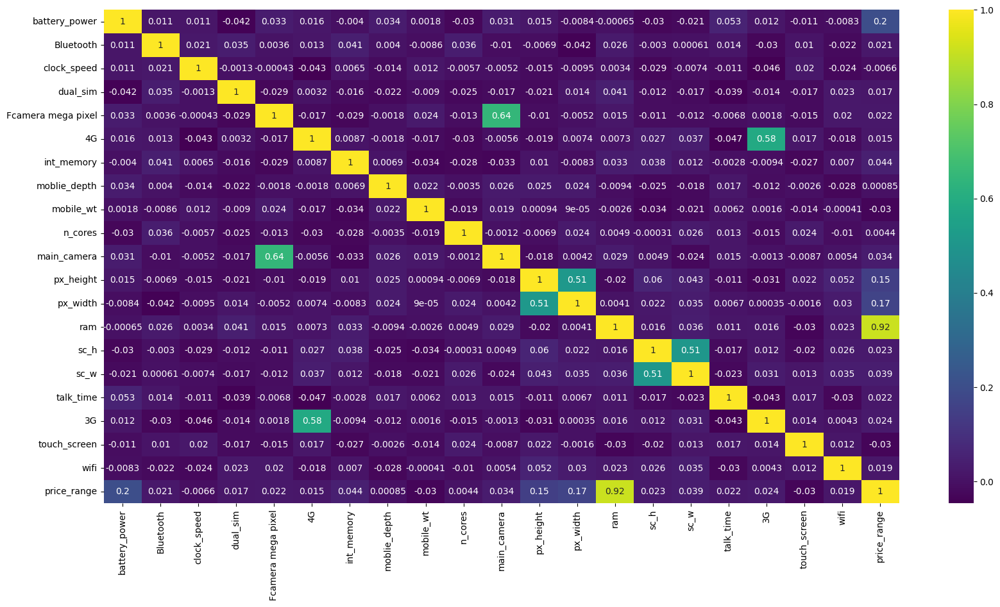

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))         # Sample figsize in inches
sns.heatmap(df.corr(), cmap='viridis', annot=True)


### Here's a conclusion based on the correlation values:

###**1.Strong Positive Correlation (Highly Related):**

###"ram" has a very strong positive correlation with "price_range" (0.917). This suggests that as the RAM of the mobile device increases, the price range tends to increase significantly.
###**2.Moderate Positive Correlation (Moderately Related):**

###"battery_power" (0.201), "px_width" (0.166), and "px_height" (0.149) have moderate positive correlations with "price_range." This implies that higher battery power and screen resolution are associated with higher price ranges.
###**3.Weak Positive Correlation (Slightly Related):**

###"int_memory" (0.044), "sc_w" (0.039), "main_camera" (0.034), and other features have weak positive correlations with "price_range." These features have a relatively minor influence on the price range.
###**4.Weak Negative Correlation (Slightly Inverse Related):**

###"mobile_wt" (-0.030) and "touch_screen" (-0.030) have weak negative correlations with "price_range." This suggests that heavier mobiles and those without touch screens tend to be associated with slightly lower price ranges.
###**5.Very Weak Correlation (Negligible):**

###Features like "n_cores," "moblie_depth," and "clock_speed" have very weak or negligible correlations with "price_range." Their influence on the price range is minimal.


#**In summary, the most significant factors influencing the "price_range" of mobile devices in your dataset are "ram," "battery_power," "px_width," and "px_height." These features have positive correlations, indicating that higher values for these features tend to lead to higher price ranges. However, it's essential to consider other factors and perform further analysis to build a comprehensive pricing model for mobile devices.**

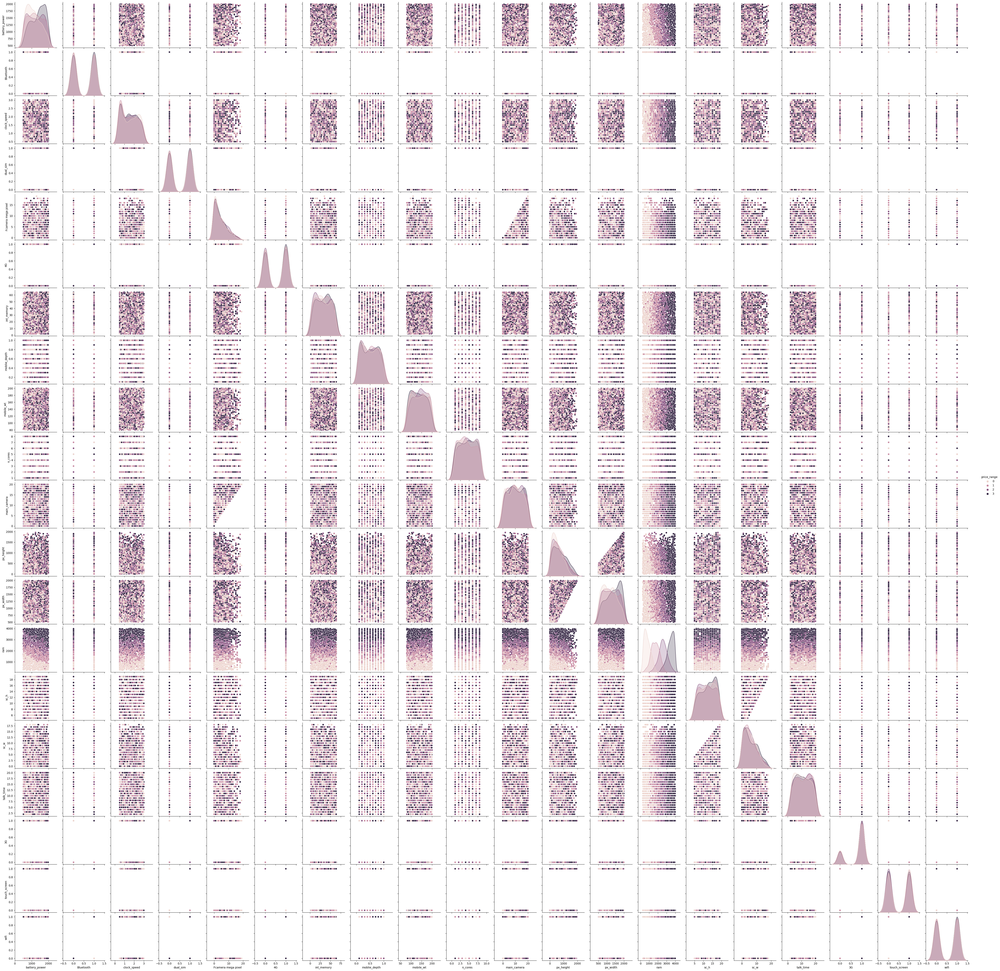

In [ ]:
# Pair Plot visualization code
sns.pairplot(df, hue="price_range")

###**Data preprocessing**

In [ ]:
#drop least important columns

df.drop(['clock_speed','mobile_wt','touch_screen'],axis=1,inplace=True)


In [ ]:
df

,battery_power,Bluetooth,dual_sim,Fcamera mega pixel,4G,int_memory,moblie_depth,n_cores,main_camera,px_height,px_width,ram,sc_h,sc_w,talk_time,3G,wifi,price_range
0,842,0,0,1,0,7,0.6,2,2,20,756,2549,9,7,19,0,1,1
1,1021,1,1,0,1,53,0.7,3,6,905,1988,2631,17,3,7,1,0,2
2,563,1,1,2,1,41,0.9,5,6,1263,1716,2603,11,2,9,1,0,2
3,615,1,0,0,0,10,0.8,6,9,1216,1786,2769,16,8,11,1,0,2
4,1821,1,0,13,1,44,0.6,2,14,1208,1212,1411,8,2,15,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,1,0,1,2,0.8,6,14,1222,1890,668,13,4,19,1,0,0
1996,1965,1,1,0,0,39,0.2,4,3,915,1965,2032,11,10,16,1,1,2
1997,1911,0,1,1,1,36,0.7,8,3,868,1632,3057,9,1,5,1,0,3
1998,1512,0,0,4,1,46,0.1,5,5,336,670,869,18,10,19,1,1,0


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 [Text(0, 0, 'battery_power'),
  Text(1, 0, 'Bluetooth'),
  Text(2, 0, 'dual_sim'),
  Text(3, 0, 'Fcamera mega pixel'),
  Text(4, 0, '4G'),
  Text(5, 0, 'int_memory'),
  Text(6, 0, 'moblie_depth'),
  Text(7, 0, 'n_cores'),
  Text(8, 0, 'main_camera'),
  Text(9, 0, 'px_height'),
  Text(10, 0, 'px_width'),
  Text(11, 0, 'ram'),
  Text(12, 0, 'sc_h'),
  Text(13, 0, 'sc_w'),
  Text(14, 0, 'talk_time'),
  Text(15, 0, '3G'),
  Text(16, 0, 'wifi'),
  Text(17, 0, 'price_range')])

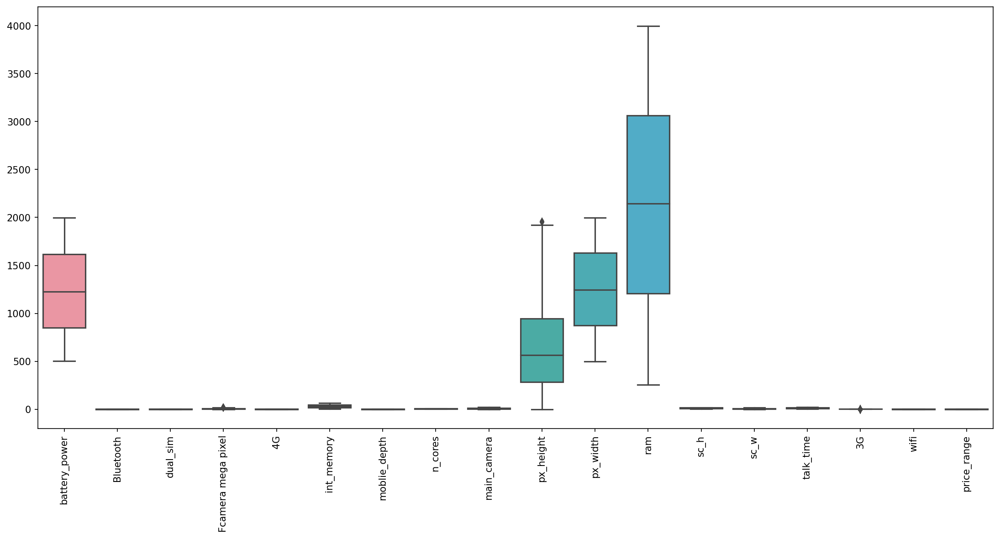

In [ ]:
plt.figure(figsize=(18,8),dpi=150)
sns.boxplot(data = df)
plt.xticks(rotation=90)

In [ ]:
# Define the IQR threshold for outlier detection
iqr_threshold = 1.5  # You can adjust this threshold as needed

# Calculate the IQR for each column in the DataFrame
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Create a boolean mask to identify outliers
outlier_mask = ((df < (Q1 - iqr_threshold * IQR)) | (df > (Q3 + iqr_threshold * IQR))).any(axis=1)

# Remove rows with outliers
df_cleaned = df[~outlier_mask]




(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 [Text(0, 0, 'battery_power'),
  Text(1, 0, 'Bluetooth'),
  Text(2, 0, 'dual_sim'),
  Text(3, 0, 'Fcamera mega pixel'),
  Text(4, 0, '4G'),
  Text(5, 0, 'int_memory'),
  Text(6, 0, 'moblie_depth'),
  Text(7, 0, 'n_cores'),
  Text(8, 0, 'main_camera'),
  Text(9, 0, 'px_height'),
  Text(10, 0, 'px_width'),
  Text(11, 0, 'ram'),
  Text(12, 0, 'sc_h'),
  Text(13, 0, 'sc_w'),
  Text(14, 0, 'talk_time'),
  Text(15, 0, '3G'),
  Text(16, 0, 'wifi'),
  Text(17, 0, 'price_range')])

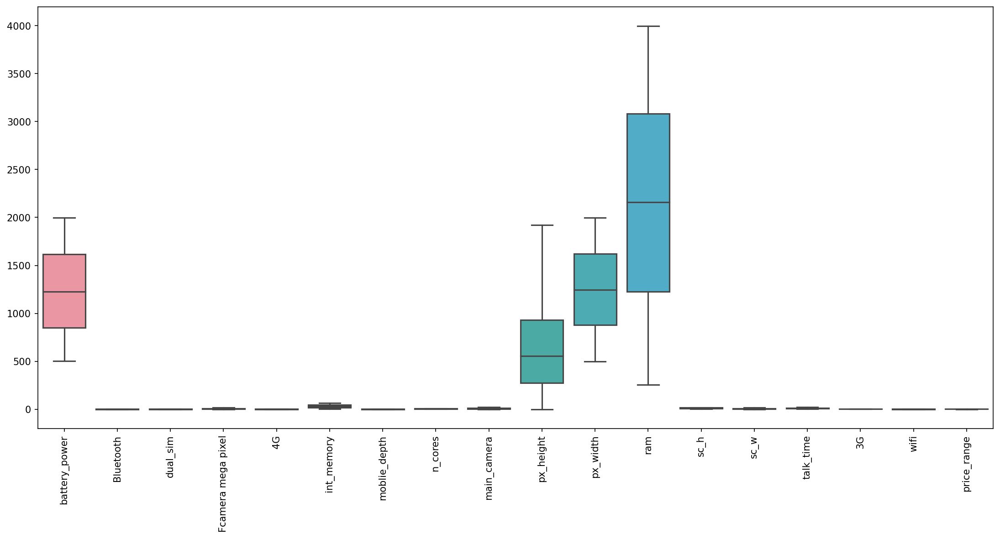

In [ ]:
plt.figure(figsize=(18,8),dpi=150)
sns.boxplot(data = df_cleaned)
plt.xticks(rotation=90)

###**Data Manupulation**